In [1]:
# Quantum Machine Learning
import pennylane as qml
from pennylane import qaoa

# Classical Machine Learning
import tensorflow as tf

# Generation of graphs
import networkx as nx

# Standard Python libraries
import numpy as np
import matplotlib.pyplot as plt
import random

# Fix the seed for reproducibility, which affects all random functions in this demo
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

/Users/edoardozappia/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


2024-05-30 15:51:00.546365: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def create_graph_train_dataset(num_graphs):
    dataset = []
    for _ in range(num_graphs):
        n_nodes= random.randint(6, 9)
        k = random.randint(3, n_nodes-1)
        edge_prob = k / n_nodes
        G = nx.erdos_renyi_graph(n_nodes, edge_prob)
        
        dataset.append(G)
    return dataset


In [3]:
def iterate_minibatches(inputs, batchsize, shuffle=False):
    indices = np.arange(len(inputs))
    if shuffle:
        np.random.shuffle(indices)
    for start_idx in range(0, len(inputs) - batchsize + 1, batchsize):
        excerpt = indices[start_idx:start_idx + batchsize]
        yield [inputs[i] for i in excerpt]

In [4]:
def create_graph_test_dataset(num_graphs):
    dataset = []
    n_nodes=12
    for _ in range(num_graphs):
        k = random.randint(3, n_nodes-1)
        edge_prob = k / n_nodes
        G = nx.erdos_renyi_graph(n_nodes, edge_prob)
        
        dataset.append(G)
    return dataset

In [5]:
def qaoa_maxcut_graph(graph, n_layers=2):
    """Compute the maximum cut of a graph using QAOA."""
    # Number of nodes in the graph
    n_nodes = graph.number_of_nodes()
    # Initialize the QAOA device
    dev = qml.device("default.qubit.tf", wires=n_nodes) #, analytic=True)
    # Define the QAOA cost function
    cost_h, mixer_h = qaoa.maxcut(graph)
    # Define the QAOA layer structure
    def qaoa_layer(gamma, alpha):
        qaoa.cost_layer(gamma, cost_h)
        qaoa.mixer_layer(alpha, mixer_h)
    # Define the QAOA quantum circuit
    @qml.qnode(dev, interface="tf", diff_method="backprop")
    def circuit(params, **kwargs):
        for w in range(n_nodes):
            qml.Hadamard(wires=w)
        qml.layer(qaoa_layer, n_layers, params[0], params[1])
        return qml.expval(cost_h)
    # Define the QAOA optimization cost function
    def qaoa_cost(params, **kwargs):
        """Evaluate the cost Hamiltonian, given the angles and the graph."""
        # This qnode evaluates the expectation value of the cost hamiltonian operator
        return circuit(params)
    return qaoa_cost

In [6]:
graphs = create_graph_train_dataset(20)

In [7]:
# Create an instance of a QAOA circuit given a graph.
cost = qaoa_maxcut_graph(graph=graphs[0], n_layers=2)

# Since we use only one layer in QAOA, params have the shape 1 x 2,
# in the form [[alpha, gamma]].
x = tf.Variable([[0.5, 0.5], [0.5, 0.5]], dtype=tf.float32)
# Evaluate th QAOA instance just created with some angles.
print(cost(x))

tf.Tensor(-2.1014945825821867, shape=(), dtype=float64)


In [8]:
n_layers = 2
cell = tf.keras.layers.LSTMCell(2 * n_layers)

In [9]:
#This is the list of QAOA cost functions for each graph
graph_cost_list = [qaoa_maxcut_graph(g) for g in graphs]

# These cost functions will be used to train the LSTM model:
# The LSTM model will take as input the cost functions and will output the QAOA solution.
# At each iteration of the LSTM, one execution of the quantum circuit is performed.

In [10]:
def observed_improvement_loss(costs):
    """
    Compute the observed improvement loss based on the costs from each iteration.
    
    Args:
    costs (list of tf.Tensor): A list of tensors representing the cost at each iteration.
    
    Returns:
    tf.Tensor: The observed improvement loss.
    """
    initial_cost = costs[0]
    final_cost = costs[-1]

    # Calculate the observed improvement
    improvement = initial_cost - final_cost

    # Calculate the loss as the negative improvement (since we want to minimize loss, maximizing improvement)
    loss = -improvement

    return tf.reshape(loss, shape=(1, 1))

In [11]:
def hybrid_iteration(inputs, graph_cost, n_layers=2):
    """Perform a single time step in the computational graph of the custom RNN."""

    # Unpack the input list containing the previous cost, parameters,
    # and hidden states (denoted as 'h' and 'c').
    prev_cost = inputs[0]
    prev_params = inputs[1]
    prev_h = inputs[2]
    prev_c = inputs[3]

    # Concatenate the previous parameters and previous cost to create new input
    new_input = tf.concat([prev_cost, prev_params], axis=-1)

    # Call the LSTM cell, which outputs new values for the parameters along
    # with new internal states h and c
    new_params, [new_h, new_c] = cell(new_input, states=[prev_h, prev_c])

    # Reshape the parameters to correctly match those expected by PennyLane
    _params = tf.reshape(new_params, shape=(2, n_layers))

    # Performing one calculation with the quantum circuit with new parameters
    _cost = graph_cost(_params)

    # Reshape to be consistent with other tensors
    new_cost = tf.reshape(tf.cast(_cost, dtype=tf.float32), shape=(1, 1))

    return [new_cost, new_params, new_h, new_c]


def recurrent_loop(graph_cost, n_layers=2, intermediate_steps=False, num_iterations=10):
    """Creates the recurrent loop for the Recurrent Neural Network."""
    # Initialize starting all inputs (cost, parameters, hidden states) as zeros.
    initial_cost = tf.ones(shape=(1, 1))
    initial_params = tf.ones(shape=(1, 2 * n_layers))
    initial_h = tf.ones(shape=(1, 2 * n_layers))
    initial_c = tf.ones(shape=(1, 2 * n_layers))

    # Initialize the output list with the initial state
    outputs = [hybrid_iteration([initial_cost, initial_params, initial_h, initial_c], graph_cost, n_layers)]

    # Perform the iterations
    for _ in range(1, num_iterations):
        outputs.append(hybrid_iteration(outputs[-1], graph_cost, n_layers))

    # Extract the costs from the outputs
    costs = [output[0] for output in outputs]

    #DEBUG
    print("Intermediary costs:", [cost.numpy() for cost in costs])
    #DEBUG
    
    # Calculate the observed improvement loss
    loss = observed_improvement_loss(costs)
    
    
    if intermediate_steps:
        params = [output[1] for output in outputs]
        return params + [loss]
    else:
        return loss


In [12]:
def train_step(graph_cost):
    """Single optimization step in the training procedure."""

    with tf.GradientTape() as tape:
        # Evaluates the cost function
        loss = recurrent_loop(graph_cost)

    # Evaluates gradients, cell is the LSTM cell defined previously
    grads = tape.gradient(loss, cell.trainable_weights)

    #DEBUG
    #grads = [tf.clip_by_value(grad, -1.0, 1.0) for grad in grads]
    #DEBUG

    # Apply gradients and update the weights of the LSTM cell
    opt.apply_gradients(zip(grads, cell.trainable_weights))
    return loss

In [13]:
# Select an optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.1)

# Set the number of training epochs
epochs = 10
batch_size = 4

for epoch in range(epochs):
    print(f"Epoch {epoch+1}")
    for batch in iterate_minibatches(graph_cost_list, batch_size, shuffle=True):
        total_loss = np.array([])
        batch_graphs = batch
        for i, graph_cost in enumerate(batch_graphs):
            loss = train_step(graph_cost)
            total_loss = np.append(total_loss, loss.numpy())
        # Log every 5 batches.
        #if i % 5 == 0:
            print(f" > Graph {i+1}/{len(graph_cost_list)} - Loss: {loss[0][0]}")
        print(f" >> Mean Loss during epoch: {np.mean(total_loss)}")

Epoch 1
Intermediary costs: [array([[-1.6417482]], dtype=float32), array([[-2.8399684]], dtype=float32), array([[-3.77943]], dtype=float32), array([[-3.7099543]], dtype=float32), array([[-3.685224]], dtype=float32), array([[-3.6569684]], dtype=float32), array([[-3.6372845]], dtype=float32), array([[-3.6237514]], dtype=float32), array([[-3.6147141]], dtype=float32), array([[-3.608742]], dtype=float32)]
 > Graph 1/20 - Loss: -1.966993808746338
Intermediary costs: [array([[-6.2298813]], dtype=float32), array([[-7.3704586]], dtype=float32), array([[-7.3726616]], dtype=float32), array([[-7.3703523]], dtype=float32), array([[-7.360238]], dtype=float32), array([[-7.3543377]], dtype=float32), array([[-7.350496]], dtype=float32), array([[-7.3482018]], dtype=float32), array([[-7.3468437]], dtype=float32), array([[-7.3460517]], dtype=float32)]
 > Graph 2/20 - Loss: -1.1161704063415527
Intermediary costs: [array([[-3.7238393]], dtype=float32), array([[-6.005767]], dtype=float32), array([[-5.899385

In [27]:
# Select an optimizer
#opt = tf.keras.optimizers.Adam(learning_rate=0.1)

# Set the number of training epochs
#epochs = 10

#for epoch in range(epochs):
#    print(f"Epoch {epoch+1}")
#    total_loss = np.array([])
#    for i, graph_cost in enumerate(graph_cost_list):
#        loss = train_step(graph_cost)
#        total_loss = np.append(total_loss, loss.numpy())
#        # Log every 5 batches.
#        #if i % 5 == 0:
#        print(f" > Graph {i+1}/{len(graph_cost_list)} - Loss: {loss[0][0]}")
#    print(f" >> Mean Loss during epoch: {np.mean(total_loss)}")

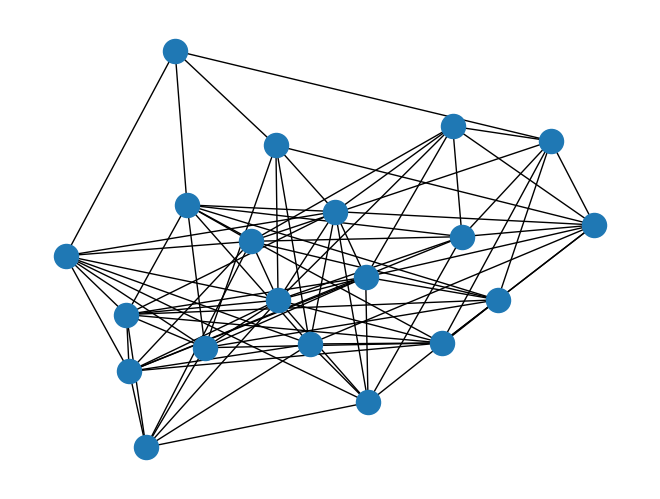

In [19]:
new_graph = nx.gnp_random_graph(20, p=3 / 7)
new_cost = qaoa_maxcut_graph(new_graph)

nx.draw(new_graph)

In [20]:
# Apply the RNN (be sure that training was performed)
res = recurrent_loop(new_cost, intermediate_steps=True)

# Extract all angle suggestions
start_zeros = tf.zeros(shape=(2 * n_layers, 1))
guess_0 = res[0]
guess_1 = res[1]
guess_2 = res[2]
guess_3 = res[3]
guess_4 = res[4]
guess_5 = guess_list[5]
guess_6 = guess_list[6]
guess_7 = guess_list[7]
guess_8 = guess_list[8]
guess_9 = guess_list[9]

final_loss = res[5]

# Wrap them into a list
guesses = [start_zeros, guess_0, guess_1, guess_2, guess_3, guess_4]

# Losses from the hybrid LSTM model
lstm_losses = [new_cost(tf.reshape(guess, shape=(2, n_layers))) for guess in guesses]

Intermediary costs: [array([[-36.755405]], dtype=float32), array([[-44.904953]], dtype=float32), array([[-45.96169]], dtype=float32), array([[-44.995903]], dtype=float32), array([[-45.73323]], dtype=float32), array([[-45.421574]], dtype=float32), array([[-45.534523]], dtype=float32), array([[-45.498283]], dtype=float32), array([[-45.50863]], dtype=float32), array([[-45.506065]], dtype=float32)]


In [31]:
start_zeros = tf.zeros(shape=(2 * n_layers, 1))

# Inizializza le variabili per memorizzare i valori di guess
guess_list = []
guess_list.append(start_zeros)

# Esegui 10 iterazioni
for i in range(10):
    guess = res[i]  # Supponiamo che res abbia almeno 10 elementi
    guess_list.append(guess)

# Losses from the hybrid LSTM model
lstm_losses = [new_cost(tf.reshape(guess, shape=(2, n_layers))) for guess in guess_list]

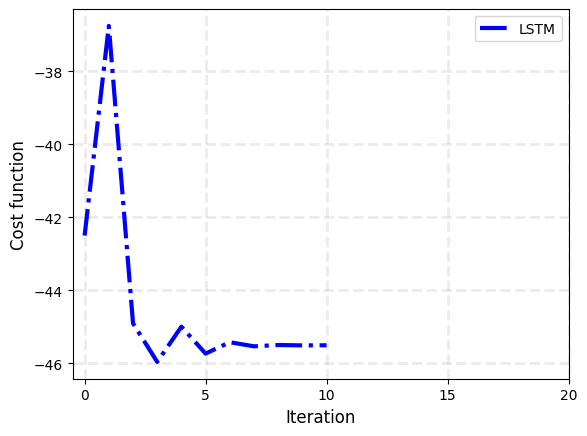

In [32]:
fig, ax = plt.subplots()

plt.plot(lstm_losses, color="blue", lw=3, ls="-.", label="LSTM")

plt.grid(ls="--", lw=2, alpha=0.25)
plt.ylabel("Cost function", fontsize=12)
plt.xlabel("Iteration", fontsize=12)
plt.legend()
ax.set_xticks([0, 5, 10, 15, 20])
plt.show()

In [26]:
# Parameters are randomly initialized
x = tf.Variable(np.random.rand(2, 2))

# We set the optimizer to be a Stochastic Gradient Descent
opt = tf.keras.optimizers.SGD(learning_rate=0.01)
step = 15

# Training process
steps = []
sdg_losses = []
for _ in range(step):
    with tf.GradientTape() as tape:
        loss = new_cost(x)

    steps.append(x)
    sdg_losses.append(loss)

    gradients = tape.gradient(loss, [x])
    opt.apply_gradients(zip(gradients, [x]))
    print(f"Step {_+1} - Loss = {loss}")

print(f"Final cost function: {new_cost(x).numpy()}\nOptimized angles: {x.numpy()}")

KeyboardInterrupt: 

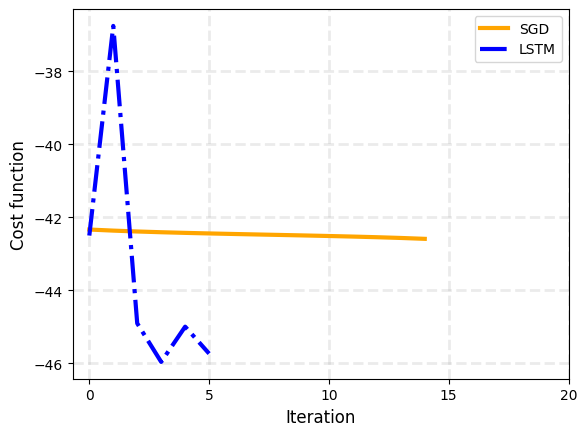

In [23]:
fig, ax = plt.subplots()

plt.plot(sdg_losses, color="orange", lw=3, label="SGD")

plt.plot(lstm_losses, color="blue", lw=3, ls="-.", label="LSTM")

plt.grid(ls="--", lw=2, alpha=0.25)
plt.legend()
plt.ylabel("Cost function", fontsize=12)
plt.xlabel("Iteration", fontsize=12)
ax.set_xticks([0, 5, 10, 15, 20])
plt.show()